In [1]:
import dash
from dash import dcc, html, Input, Output, dash_table
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.graph_objs as go_3d

/tmp/ipykernel_157003/3716241052.py:6: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = data.pct_change()


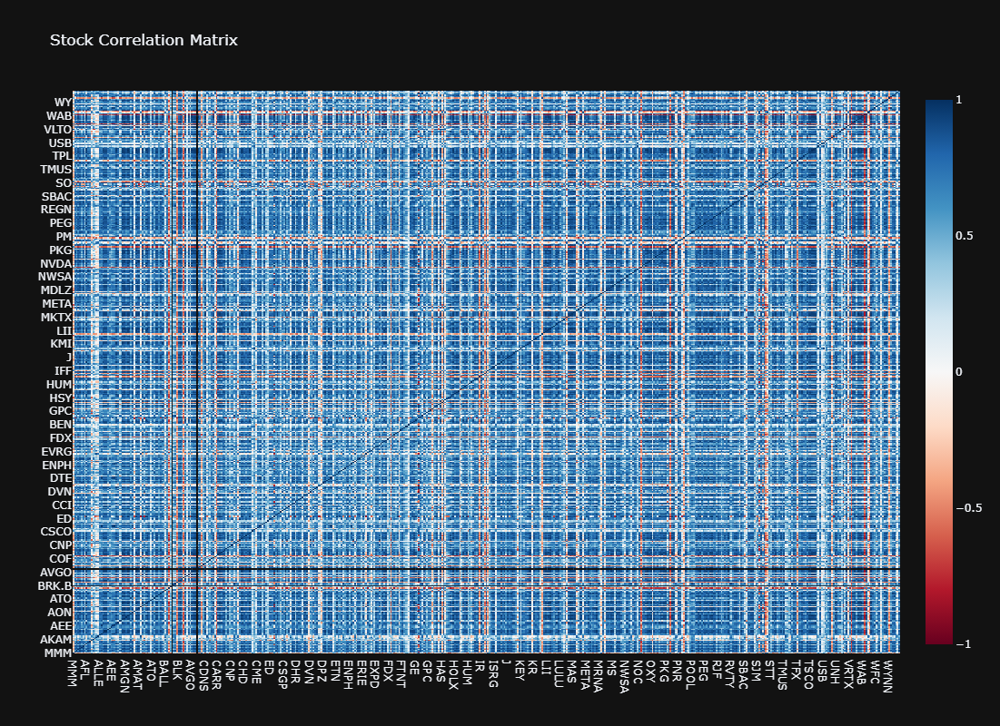

In [2]:
df = pd.read_csv('../sp500data/SP500PriceHistory.csv', parse_dates=['Date'])
df.sort_values('Date', inplace=True)
data = df.set_index('Date')

returns = data.pct_change()
annual_returns = returns.mean() * 252
annual_volatilities = returns.std() * np.sqrt(252)

moving_averages_50 = data.rolling(window=50).mean()
moving_averages_200 = data.rolling(window=200).mean()

combine = pd.DataFrame({
    'Returns': annual_returns,
    'Volatility': annual_volatilities,
    'Sharpe Ratio': annual_returns / annual_volatilities 
}).dropna()

composite_scores = (
    (combine['Returns'] / combine['Returns'].max()) * 0.4 + 
    (1 - combine['Volatility'] / combine['Volatility'].max()) * 0.4 + 
    (moving_averages_50.iloc[-1] / data.iloc[-1]) * 0.2 
)

combine['50_Day_MA'] = moving_averages_50.iloc[-1]
combine['200_Day_MA'] = moving_averages_200.iloc[-1]
combine['Composite_Score'] = composite_scores

# Calculate correlation matrix
df_numeric = data.select_dtypes(include=[np.number])
df_corr = df_numeric.corr()

corr_fig = go.Figure(
    data=go.Heatmap(
        z=df_corr,
        x=df_corr.columns,
        y=df_corr.columns,
        colorscale='RdBu',
        zmin=-1,
        zmax=1
    )
)
corr_fig.update_layout(
    title='Stock Correlation Matrix',
    width=1000,
    height=800,
    template='plotly_dark',
    paper_bgcolor='#121212',
    plot_bgcolor='#121212'
)

In [3]:
app = dash.Dash(__name__)
server = app.server

In [4]:
app.layout = html.Div([
    html.H1("SP500 Stock Analysis Dashboard", style={'textAlign': 'center', 'color': 'white'}),
    
    html.Div([
        html.Div([
            dcc.RangeSlider(
                id='quantile-slider',
                min=0,
                max=100,
                value=[80, 20],
                marks={i: f'{i}%' for i in range(0, 101, 10)},
                tooltip={'placement': 'bottom'}
            )
        ], style={'width': '80%', 'margin': '0 auto'}),
    ], style={'padding': '20px 0'}),
    
    dcc.Tabs([
        dcc.Tab(label='Risk-Return Analysis', children=[
            html.Div([
                html.Div([
                    dcc.Graph(id='risk-return-plot', style={'height': '70vh'}),
                ], style={'width': '65%', 'display': 'inline-block'}),
                
                html.Div([
                    html.Div(id='top-buy-table', style={'padding': '10px'}),
                    html.Div(id='top-sell-table', style={'padding': '10px'})
                ], style={'width': '30%', 'display': 'inline-block', 'verticalAlign': 'top'})
            ])
        ]),
        
        dcc.Tab(label='Correlation Matrix', children=[
            html.Div([
                dcc.Graph(figure=corr_fig)
            ], style={'margin': '20px'})
        ]),
        
        dcc.Tab(label='3D Analysis', children=[
            html.Div([
                dcc.Graph(id='3d-stock-analysis-plot', style={'height': '90vh', 'width': '100%'})
            ], style={'margin': '20px'})
        ])
    ], colors={
        'border': '#1a1a1a',
        'primary': '#333333',
        'background': '#1a1a1a'
    })
], style={'backgroundColor': '#121212', 'color': 'white', 'padding': '20px', 'minHeight': '100vh'})

In [5]:
@app.callback(
    [Output('risk-return-plot', 'figure'),
     Output('top-buy-table', 'children'),
     Output('top-sell-table', 'children')],
    [Input('quantile-slider', 'value')]
)
def update_dashboard(quantiles):
    top_q = np.percentile(combine['Returns'], quantiles[0])
    bottom_q = np.percentile(combine['Returns'], quantiles[1])

    fig = px.scatter(
        combine,
        x='Volatility',
        y='Returns',
        color='Sharpe Ratio',
        size='Volatility',
        hover_data=[combine.index],
        color_continuous_scale='RdYlGn',
        title='Risk-Return Analysis with Zoom Capability'
    )

    fig.update_layout(
    template='plotly_dark',
    paper_bgcolor='#121212',
    plot_bgcolor='#121212',
    hovermode='closest',
    xaxis=dict(title='Annualized Volatility', gridcolor='#333333'),
    yaxis=dict(title='Annualized Returns', gridcolor='#333333'),
    coloraxis_colorbar=dict(title='Sharpe Ratio'),
    height=700
    )

    fig.add_shape(type="rect",
        xref="paper", yref="paper",
        x0=0.7, y0=0.7, x1=1, y1=1,
        line=dict(color="Green", width=2),
        fillcolor="LightGreen", opacity=0.4
    )
    
    fig.add_shape(type="rect",
        xref="paper", yref="paper",
        x0=0.7, y0=0, x1=1, y1=0.3,
        line=dict(color="Red", width=2),
        fillcolor="LightCoral", opacity=0.4
    )
 
    top_buy = combine[combine['Returns'] > top_q].sort_values('Returns', ascending=False).head(10)
    top_sell = combine[combine['Returns'] < bottom_q].sort_values('Returns').head(10)

    buy_table = dash_table.DataTable(
        columns=[{'name': 'Stock', 'id': 'Ticker'}, 
                 {'name': 'Return', 'id': 'Returns'},
                 {'name': 'Volatility', 'id': 'Volatility'}],
        data=top_buy.reset_index().rename(columns={'index':'Ticker'}).to_dict('records'),
        style_header={
            'backgroundColor': '#004d00',
            'color': 'white', 
            'border': '1px solid #333333',
            'fontWeight': 'bold'
        },
        style_cell={'backgroundColor': '#1a1a1a', 'color': 'white', 
                   'textAlign': 'left', 'padding': '5px', 'border': '1px solid #333333'},
        style_data_conditional=[
            {'if': {'row_index': 'odd'}, 'backgroundColor': '#262626'}
        ]
    )
    
    sell_table = dash_table.DataTable(
        columns=[{'name': 'Stock', 'id': 'Ticker'}, 
                 {'name': 'Return', 'id': 'Returns'},
                 {'name': 'Volatility', 'id': 'Volatility'}],
        data=top_sell.reset_index().rename(columns={'index':'Ticker'}).to_dict('records'),
        style_header={
            'backgroundColor': '#4d0000',  # Dark red
            'color': 'white', 
            'border': '1px solid #333333',
            'fontWeight': 'bold'
        },
        style_cell={'backgroundColor': '#1a1a1a', 'color': 'white', 
                   'textAlign': 'left', 'padding': '5px', 'border': '1px solid #333333'},
        style_data_conditional=[
            {'if': {'row_index': 'odd'}, 'backgroundColor': '#262626'}
        ]
    )
    
    return fig, buy_table, sell_table

@app.callback(
    Output('3d-stock-analysis-plot', 'figure'),
    [Input('quantile-slider', 'value')]
)
def update_3d_plot(quantiles):
    color_scale = [
        [0, 'rgb(165,0,38)'],   
        [0.25, 'rgb(215,48,39)'], 
        [0.5, 'rgb(255,255,191)'], 
        [0.75, 'rgb(123,195,119)'], 
    
    norm_scores = (combine['Composite_Score'] - combine['Composite_Score'].min()) / \
                  (combine['Composite_Score'].max() - combine['Composite_Score'].min())
    
    fig = go_3d.Figure(data=[
        go_3d.Scatter3d(
            x=combine['Volatility'],
            y=combine['Returns'],
            z=combine['50_Day_MA'],
            mode='markers',
            marker=dict(
                size=8,
                color=norm_scores,  
                colorscale=color_scale,
                opacity=0.8,
                colorbar=dict(
                    title='Composite Score',
                    titleside='right'
                )
            ),
            text=combine.index,
            hovertemplate=(
                'Stock: %{text}<br>' +
                'Volatility: %{x:.4f}<br>' +
                'Returns: %{y:.4f}<br>' +
                '50-Day MA: %{z:.4f}<br>' +
                'Composite Score: %{marker.color:.4f}<extra></extra>'
            )
        )
    ])
    
    fig.update_layout(
        title='3D Stock Analysis: Volatility, Returns, and Moving Average',
        scene=dict(
            xaxis_title='Volatility',
            yaxis_title='Returns',
            zaxis_title='50-Day Moving Average'
        ),
        template='plotly_dark',
        paper_bgcolor='#121212',
        plot_bgcolor='#121212',
        height=900,  
        width=1200  
    )
    
    return fig

In [6]:
if __name__ == '__main__':
    app.run_server(debug=True, port=8051)

print("http://127.0.0.1:8051")

http://127.0.0.1:8051
